In [1]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [2]:
def construct_image_cube(folder_name):
    folder_path = f'dss_dataset/ms_tif_images/{folder_name}'
    image_files = [f for f in os.listdir(folder_path) if f.endswith('.tif')]
    image_files = sorted(image_files)

    image_cube = np.empty((4, ), dtype=object)

    count = 0
    for image_file in image_files:
        image_path = os.path.join(folder_path, image_file)
        image = cv2.imread(image_path, cv2.IMREAD_UNCHANGED).astype(np.float64)
        image_cube[count] = image
        count += 1

    image_cube = np.stack(image_cube, axis=0)

    return image_cube


In [3]:
frag_name='124-009'
ir_path='dss_dataset/ir_images/4Q393-124-9.jpg'
color_path='dss_dataset/color_images/4Q393-124-9.jpg'


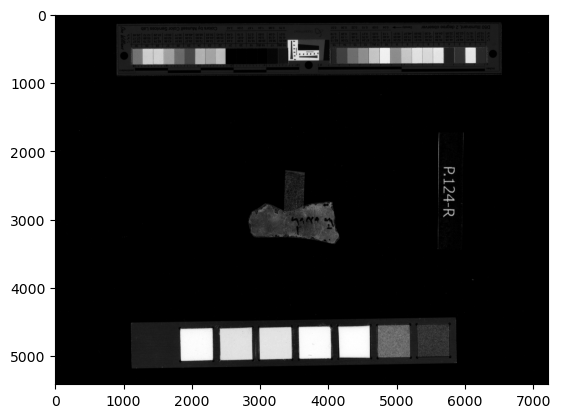

In [4]:
ir = cv2.imread(ir_path, 0)
plt.imshow(ir, cmap='gray')

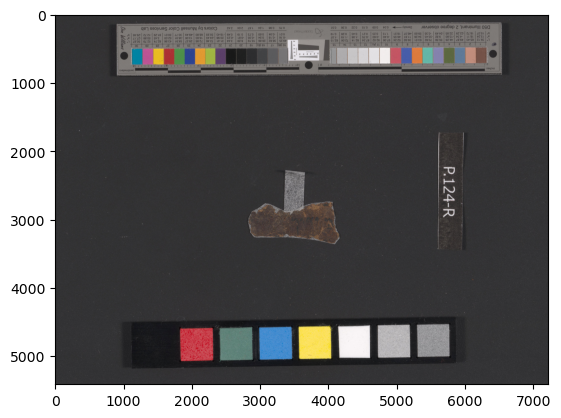

In [5]:
color = cv2.imread(color_path, 1)
plt.imshow(color[:,:,::-1])

In [6]:
image_cube_124_001 = construct_image_cube(frag_name)

In [7]:
image_cube_124_001.shape

(4, 5412, 7216)

In [8]:
bar_mask_recto = np.zeros(image_cube_124_001.shape[1:], dtype=np.uint8)

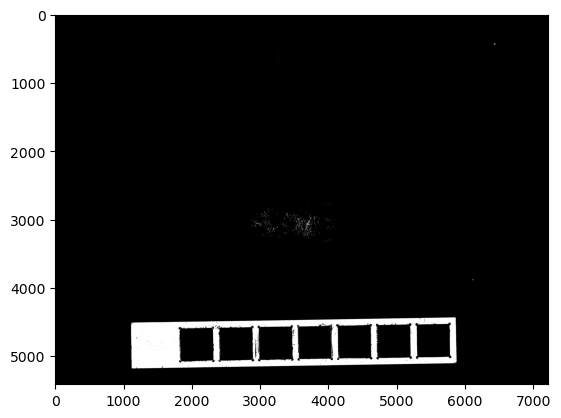

In [9]:
#colorbar
I1 = image_cube_124_001[1, :, :]
I0 = image_cube_124_001[0, :, :]

mask1 = I1-I0<600
mask2 = I1-I0>300
mask3 = I0<100
mask = mask1&mask2&mask3

colorbar = np.zeros_like(I0)
colorbar [mask] = 255
colorbar = np.uint8(colorbar)
plt.imshow(colorbar , cmap = 'gray')

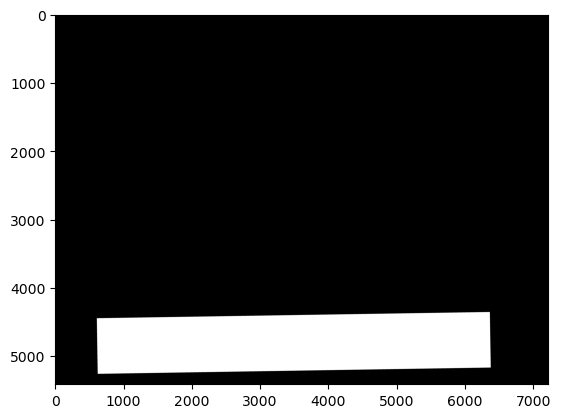

In [10]:

contours, _ = cv2.findContours(colorbar, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
largest_contour = max(contours, key=cv2.contourArea)
rect = cv2.minAreaRect(largest_contour)
box = cv2.boxPoints(rect)
center = np.mean(box, axis=0)
box = box - center 
for i in range(len(box)):
    box[i] *= 1 + (500 / np.linalg.norm(box[i]))  # Scale points away from center
box = box + center 

box = np.intp(box)
cv2.drawContours(bar_mask_recto, [box], 0, (1), -1)

plt.imshow(bar_mask_recto, cmap='gray')


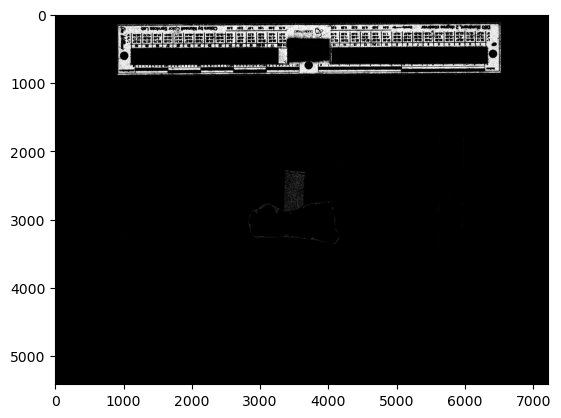

In [11]:
#metricbar
I1 = image_cube_124_001[1, :, :]*(1-bar_mask_recto)
I0 = image_cube_124_001[0, :, :]*(1-bar_mask_recto)

mask1 = I0>500
mask2 = I0<550
mask3 = I1-I0<80
mask = mask1 & mask2 & mask3

metricbar = np.zeros_like(I0)
metricbar [mask] = 255
metricbar = np.uint8(metricbar)
plt.imshow(metricbar , cmap = 'gray')

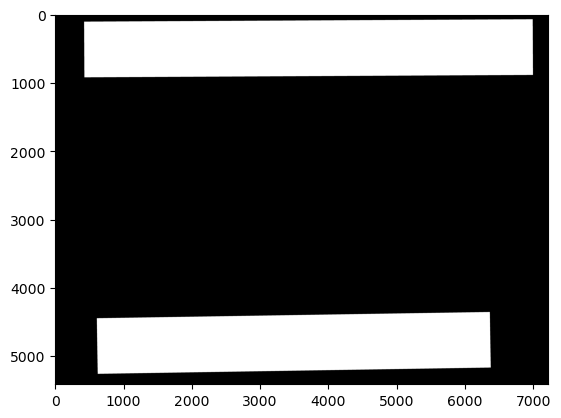

In [12]:

contours, _ = cv2.findContours(metricbar, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
largest_contour = max(contours, key=cv2.contourArea)
rect = cv2.minAreaRect(largest_contour)
box = cv2.boxPoints(rect)
center = np.mean(box, axis=0)
box = box - center  
for i in range(len(box)):
    box[i] *= 1 + (500 / np.linalg.norm(box[i]))  # Scale points away from center
box = box + center 

box = np.intp(box)
cv2.drawContours(bar_mask_recto, [box], 0, (1), -1)

plt.imshow(bar_mask_recto, cmap='gray')


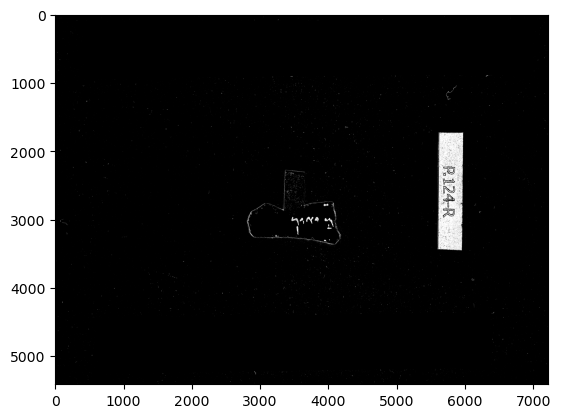

In [13]:
#codebar
I1 = image_cube_124_001[1, :, :]*(1-bar_mask_recto)
I0 = image_cube_124_001[0, :, :]*(1-bar_mask_recto)


mask1 = I1<300
mask2 = I1-I0<200
mask3 = I1-I0>50
mask4 = I1 > 1500
mask5 = I1 < 1800
mask6 = I1-I0 < 100

mask = (mask1&mask2&mask3)|(mask4 & mask5 & mask6)
codebar = np.zeros_like(I0)
codebar [mask] = 255
codebar = np.uint8(codebar)
plt.imshow(codebar , cmap = 'gray')

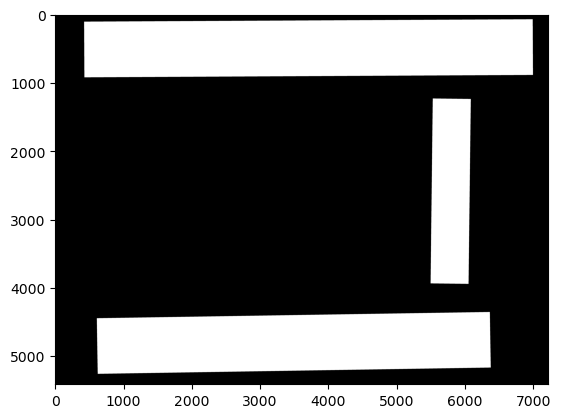

In [14]:

contours, _ = cv2.findContours(codebar, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
largest_contour = max(contours, key=cv2.contourArea)
rect = cv2.minAreaRect(largest_contour)
box = cv2.boxPoints(rect)
center = np.mean(box, axis=0)
box = box - center  
for i in range(len(box)):
    box[i] *= 1 + (500 / np.linalg.norm(box[i]))  # Scale points away from center
box = box + center 

box = np.intp(box)
cv2.drawContours(bar_mask_recto, [box], 0, (1), -1)

plt.imshow(bar_mask_recto, cmap='gray')


In [15]:
I1 = image_cube_124_001[1, :, :]*(1-bar_mask_recto)
I0 = image_cube_124_001[0, :, :]*(1-bar_mask_recto)

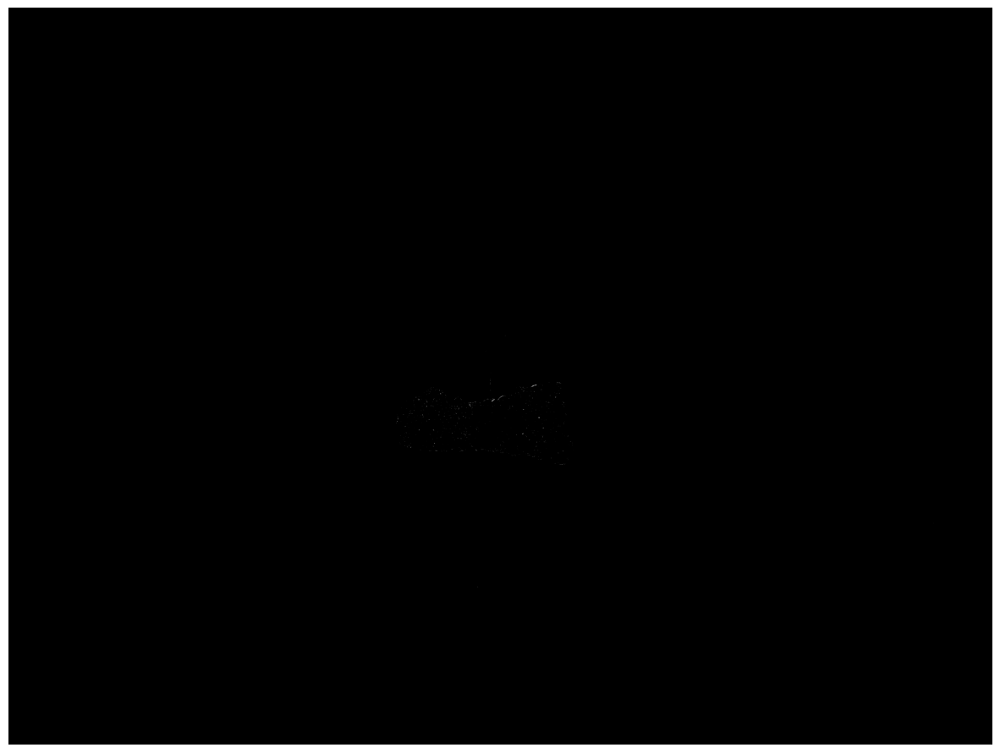

In [16]:
#par near rice
mask1 = I1-I0 > 350 
#rice near par
mask2 = I0>300 

mask = mask1&mask2

par1= np.zeros_like(I0)
par1[mask] = 255
par1 = np.uint8(par1)
par1[bar_mask_recto == 255] = 0

plt.figure(figsize=(15, 15))
plt.imshow(par1, cmap='gray')  
plt.axis('off')  
plt.show()

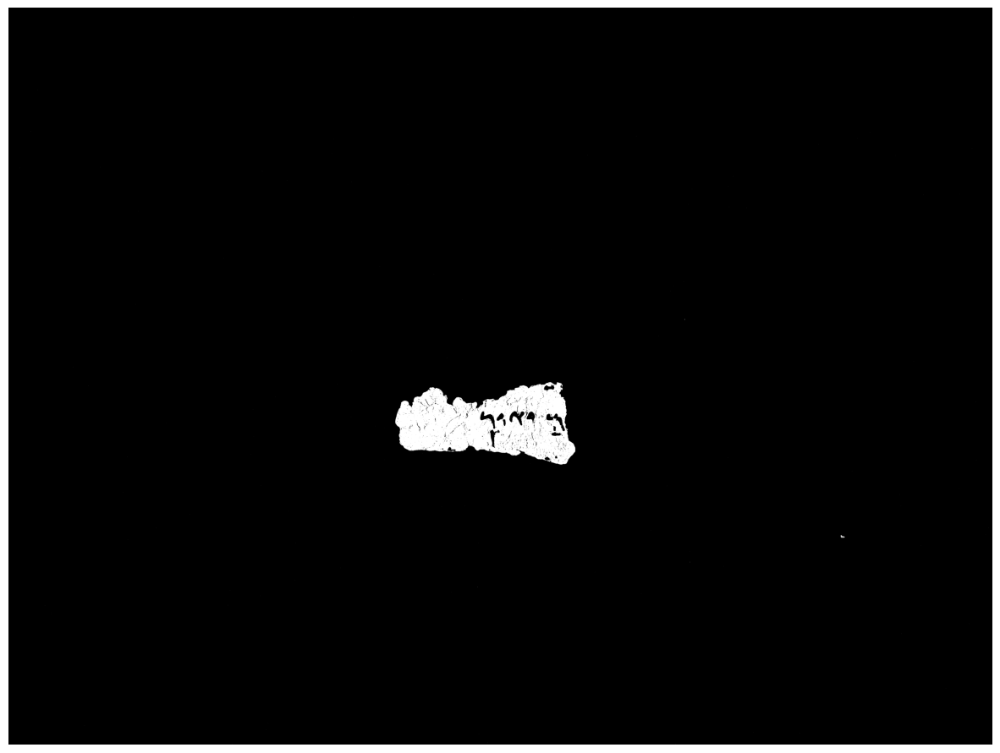

In [17]:
mask1 = I1-I0 > 350 # par near ink,back
#ink,back near par
mask2 = I0<=300
mask3 = I0>80

mask = mask1&mask2&mask3

par2= np.zeros_like(I0)
par2[mask] = 255
par2 = np.uint8(par2)
par2[bar_mask_recto == 255] = 0

plt.figure(figsize=(15, 15))
plt.imshow(par2, cmap='gray')  
plt.axis('off')  
plt.show()

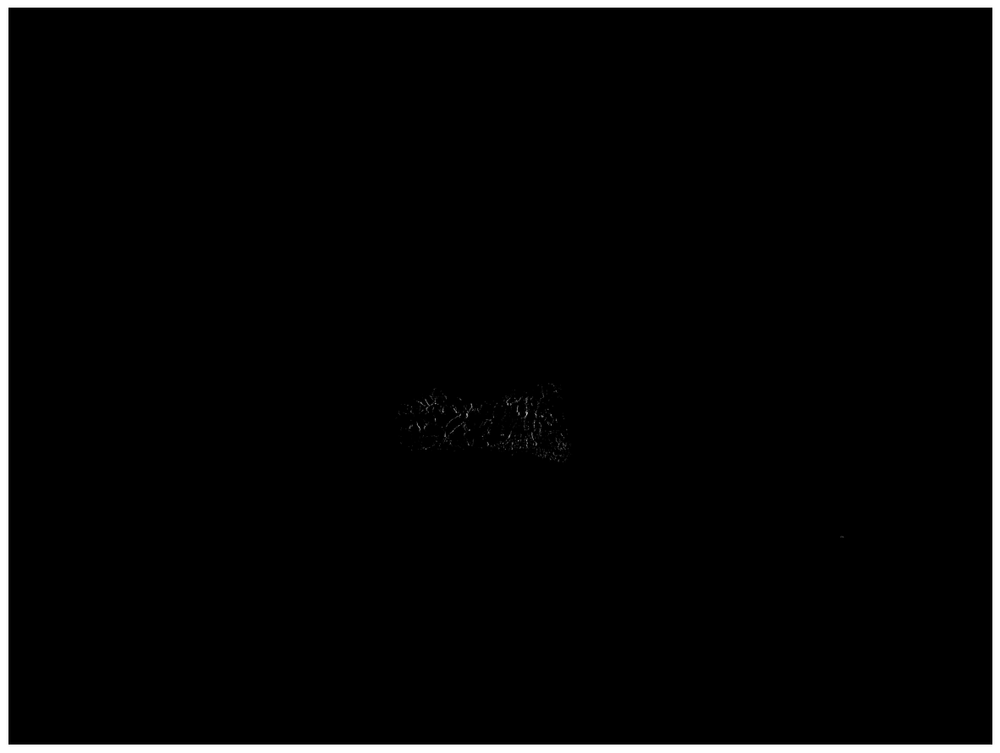

In [18]:
# par near hole
mask1 = I1-I0 > 350
#hole near par
mask2 = I0<=80

mask = mask1&mask2

par3= np.zeros_like(I0)
par3[mask] = 255
par3 = np.uint8(par3)
par3[bar_mask_recto == 255] = 0

plt.figure(figsize=(15, 15))
plt.imshow(par3, cmap='gray')  
plt.axis('off')  
plt.show()

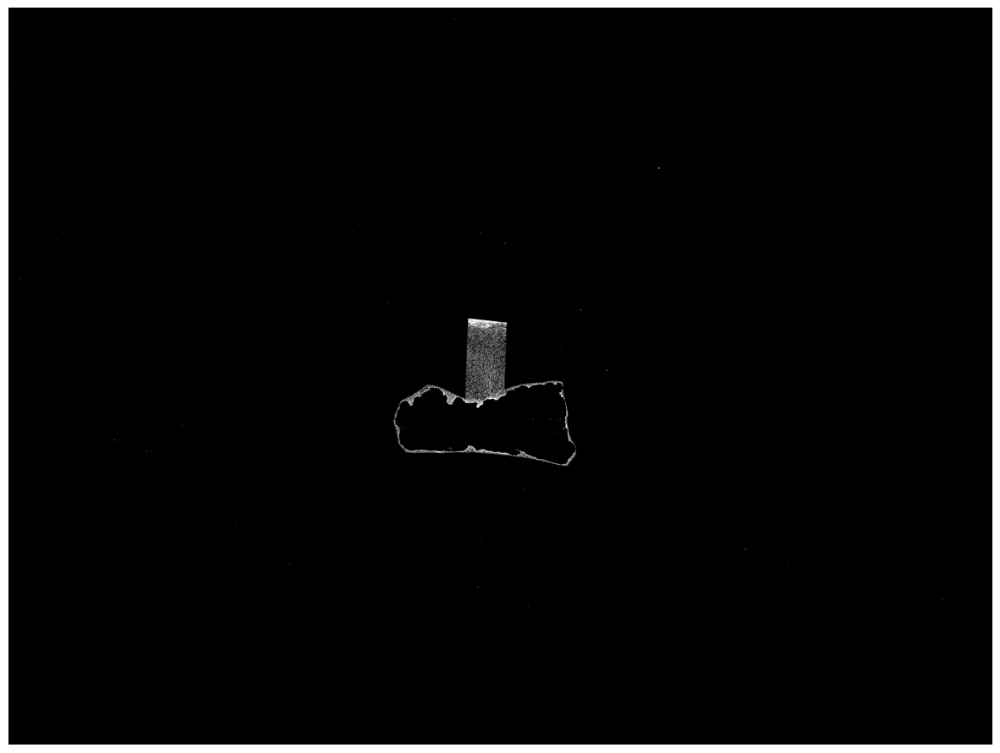

In [19]:
#ink,back near rice
mask1 = I1-I0 <= 350
mask2 = I1-I0 > 0
#rice near ink,back
mask3 = I0>200 # original is I0>300, extend rice to ink,back using I0>200

mask = mask1&mask2&mask3

rice1= np.zeros_like(I0)
rice1[mask] = 255
rice1 = np.uint8(rice1)
rice1[bar_mask_recto == 255] = 0

plt.figure(figsize=(15, 15))
plt.imshow(rice1, cmap='gray')  
plt.axis('off')  
plt.show()

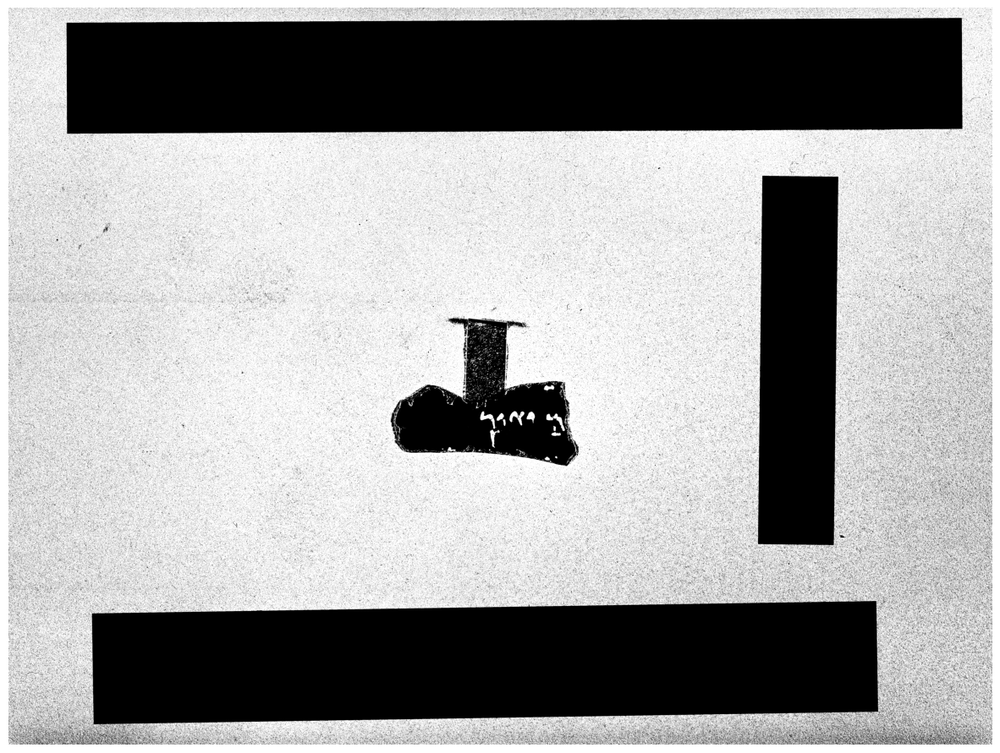

In [20]:
#ink,back near par
mask1 = I1-I0 <= 350
mask2 = I1-I0 >0
#par near ink,back
mask3 = I0>80
mask4 = I0<=300

mask = mask1&mask2&mask3&mask4

ink1= np.zeros_like(I0)
ink1[mask] = 255
ink1 = np.uint8(ink1)
ink1[bar_mask_recto == 255] = 0

plt.figure(figsize=(15, 15))
plt.imshow(ink1, cmap='gray')  
plt.axis('off')  
plt.show()

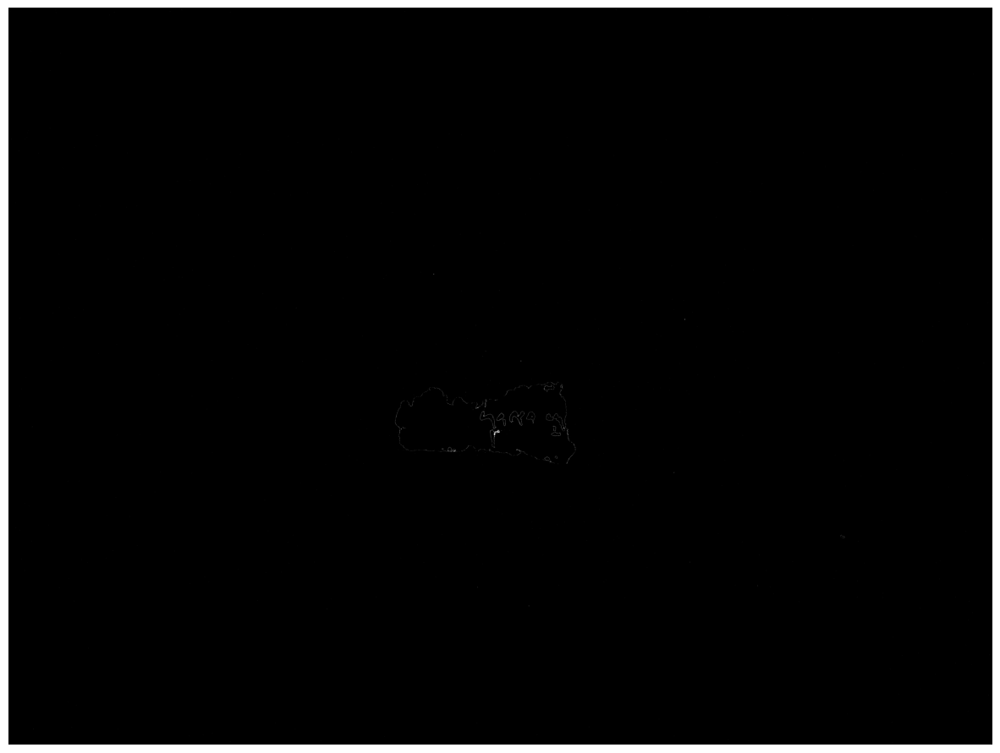

In [21]:
#ink near par
mask1 = I1-I0 <= 350
mask2 = I1-I0 >250
#par near ink
mask3 = I0>80
mask4 = I0<=300

mask = mask1&mask2&mask3&mask4

ink2= np.zeros_like(I0)
ink2[mask] = 255
ink2 = np.uint8(ink2)
ink2[bar_mask_recto == 255] = 0

plt.figure(figsize=(15, 15))
plt.imshow(ink2, cmap='gray')  
plt.axis('off')  
plt.show()

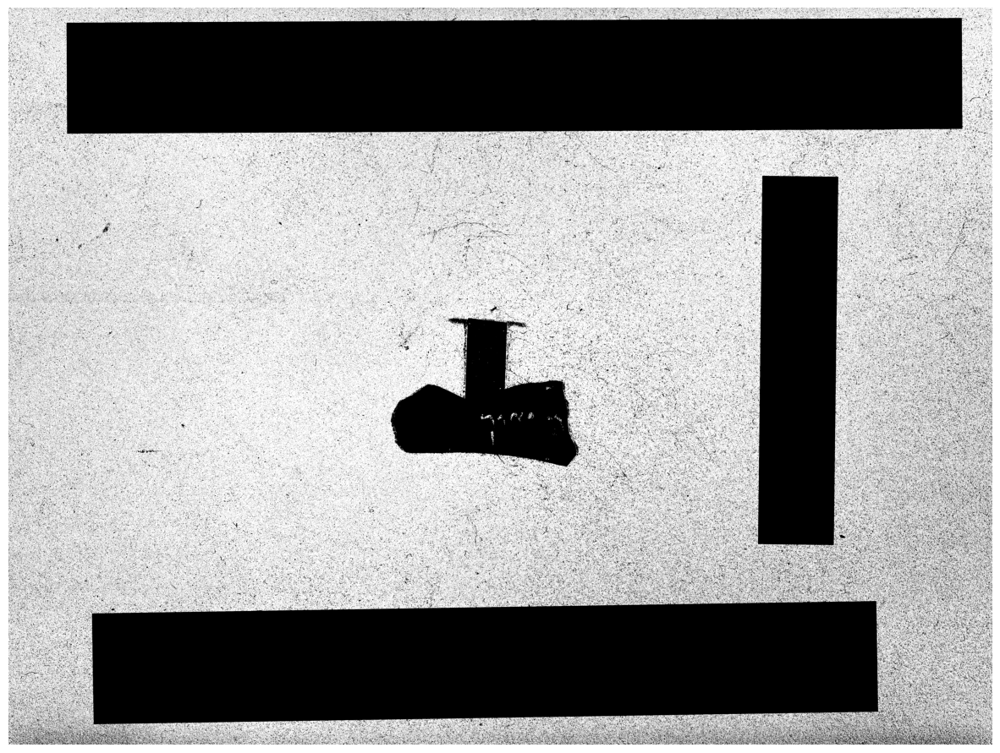

In [22]:
#back near par
mask1 = I1-I0 <= 75
mask2 = I1-I0 >0
#par near back
mask3 = I0>80
mask4 = I0<=110

mask = mask1&mask2&mask3&mask4

back1= np.zeros_like(I0)
back1[mask] = 255
back1 = np.uint8(back1)
back1[bar_mask_recto == 255] = 0

plt.figure(figsize=(15, 15))
plt.imshow(back1, cmap='gray')  
plt.axis('off')  
plt.show()

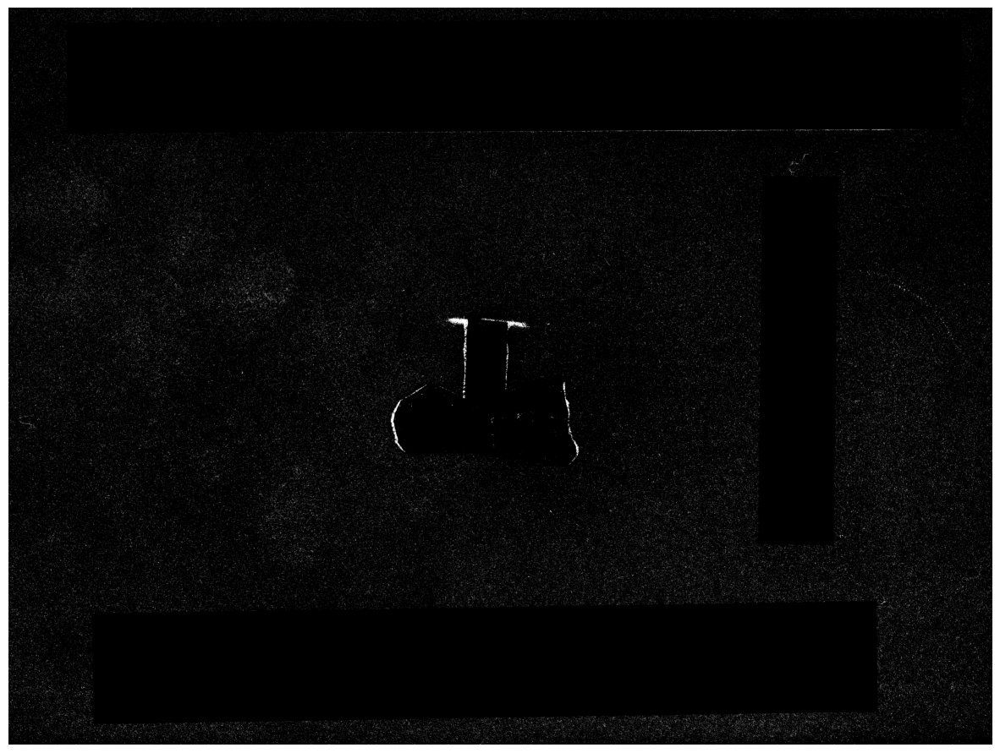

In [23]:
# ink,back near hole
mask1 = I1-I0 <= 350
mask2 = I1-I0 >0
#hole near ink, back
mask3 = I0<=80

mask = mask1&mask2&mask3

hole1= np.zeros_like(I0)
hole1[mask] = 255
hole1 = np.uint8(hole1)
hole1[bar_mask_recto == 255] = 0

plt.figure(figsize=(15, 15))
plt.imshow(hole1, cmap='gray')  
plt.axis('off')  
plt.show()

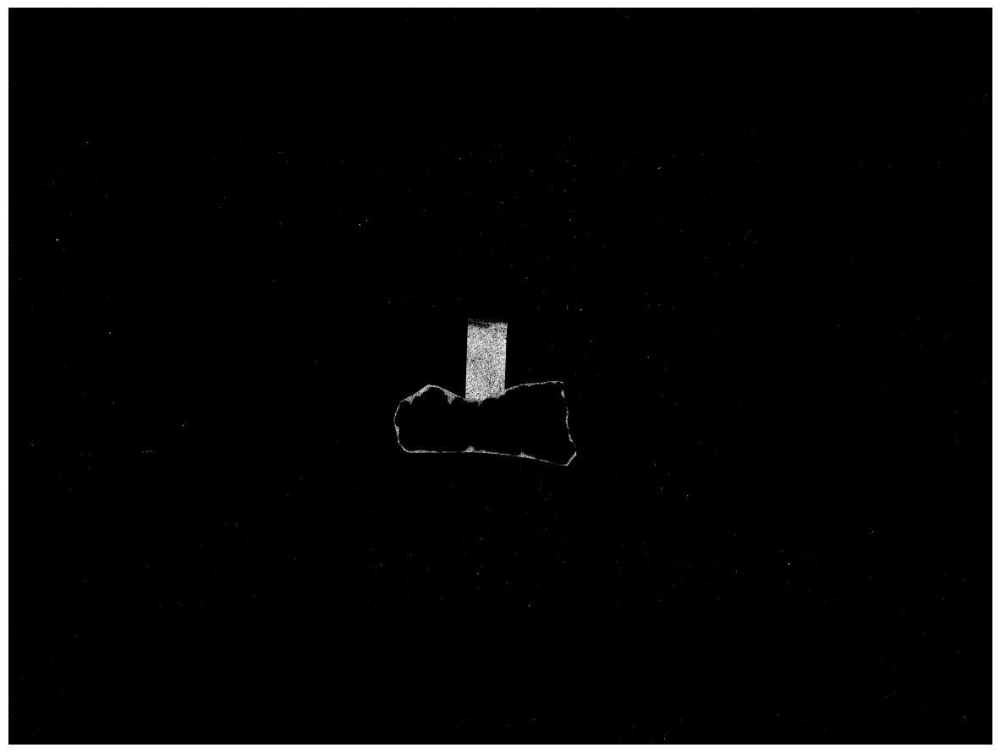

In [24]:
#rice near rice
mask1 = I1-I0 <= 0
#rice near rice
mask2 = I0>300

mask = mask1&mask2

rice2= np.zeros_like(I0)
rice2[mask] = 255
rice2 = np.uint8(rice2)
rice2[bar_mask_recto == 255] = 0

plt.figure(figsize=(15, 15))
plt.imshow(rice2, cmap='gray')  
plt.axis('off')  
plt.show()

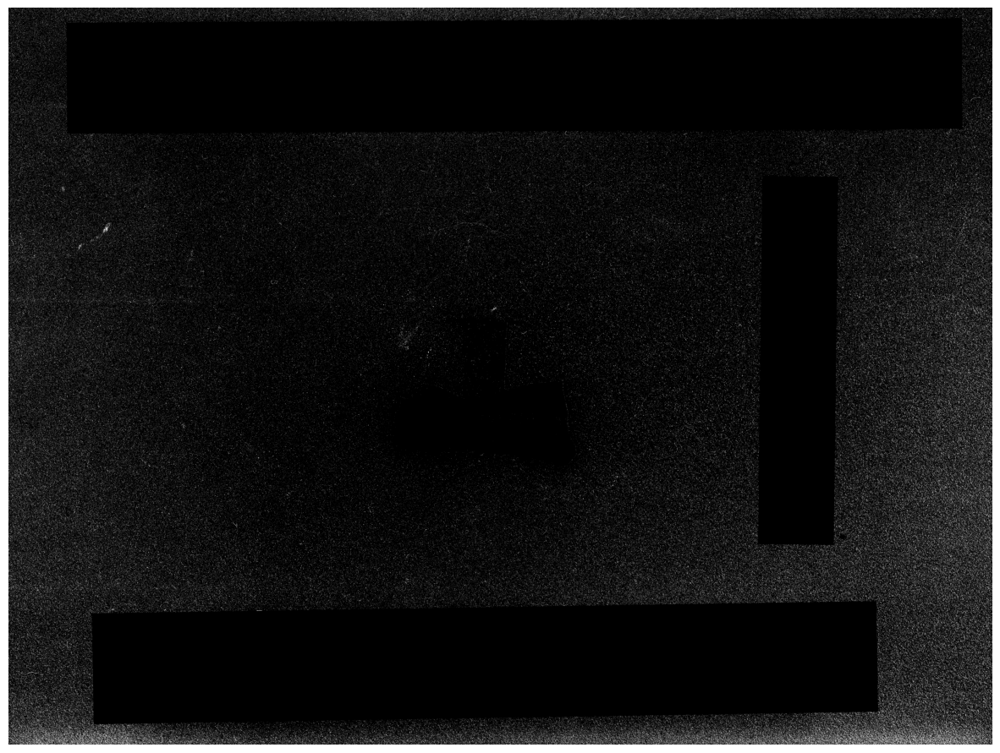

In [25]:
#ink,back near rice
mask1 = I1-I0 <= 0
#rice near ink,back
mask2 = I0<=300
mask3 = I0>80

mask = mask1&mask2&mask3

rice3= np.zeros_like(I0)
rice3[mask] = 255
rice3 = np.uint8(rice3)
rice3[bar_mask_recto == 255] = 0

plt.figure(figsize=(15, 15))
plt.imshow(rice3, cmap='gray')  
plt.axis('off')  
plt.show()

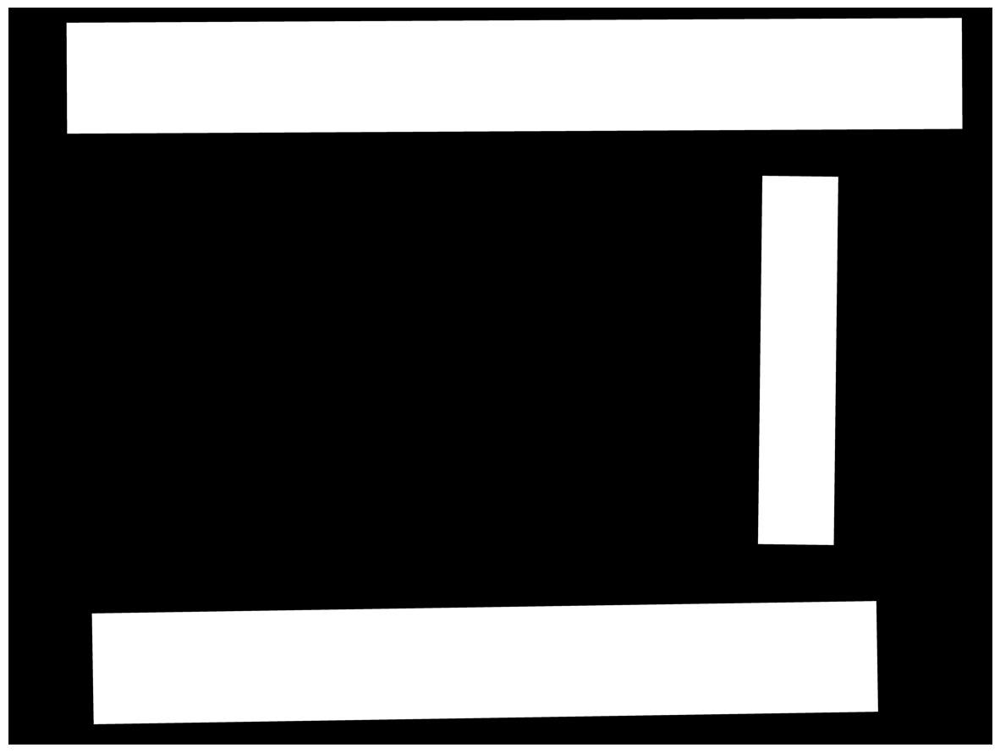

In [26]:
#rice near hole
mask1 = I1-I0 <=0
#hole near rice
mask2 = I0<=80

mask = mask1&mask2

hole2= np.zeros_like(I0)
hole2[mask] = 255
hole2 = np.uint8(hole2)
hole2[bar_mask_recto == 255] = 0

plt.figure(figsize=(15, 15))
plt.imshow(hole2, cmap='gray')  
plt.axis('off')  
plt.show()

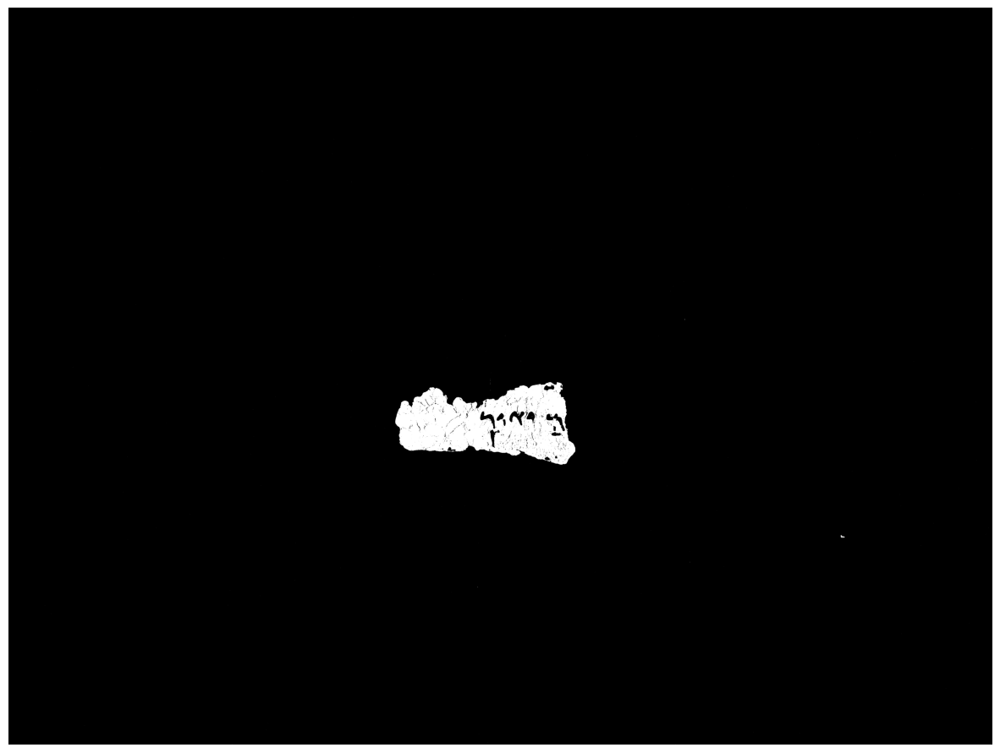

In [27]:
par = cv2.bitwise_or(par1,par2)
plt.figure(figsize=(15, 15))
plt.imshow(par, cmap='gray')  
plt.axis('off')  
plt.show()

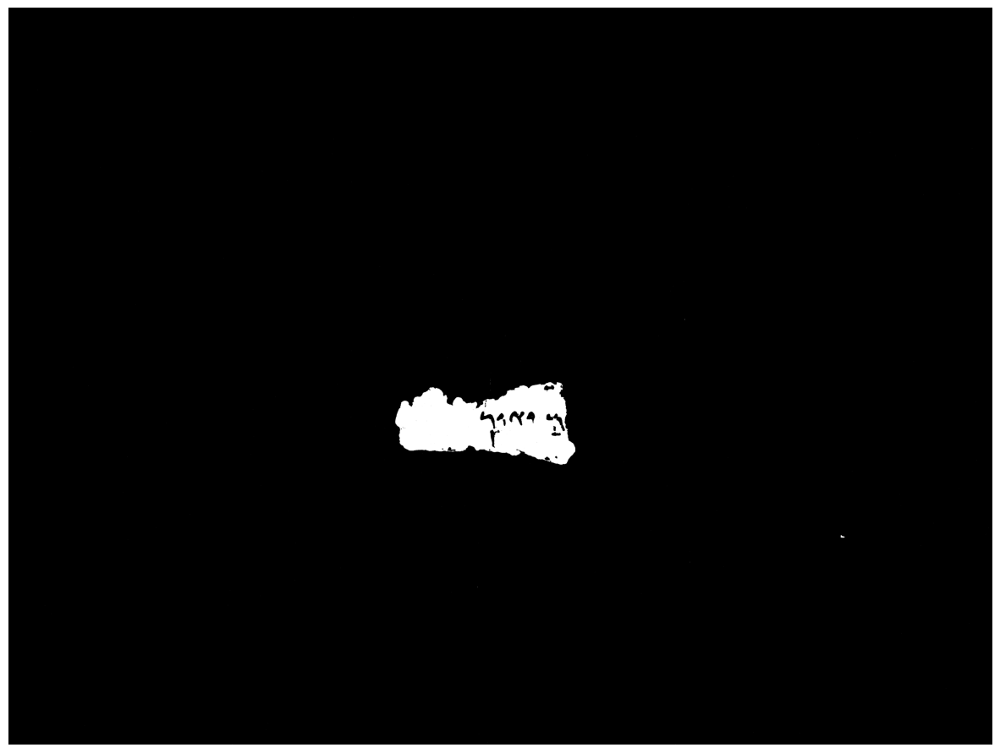

In [28]:
par = cv2.bitwise_or(par,par3)
plt.figure(figsize=(15, 15))
plt.imshow(par, cmap='gray')  
plt.axis('off')  
plt.show()

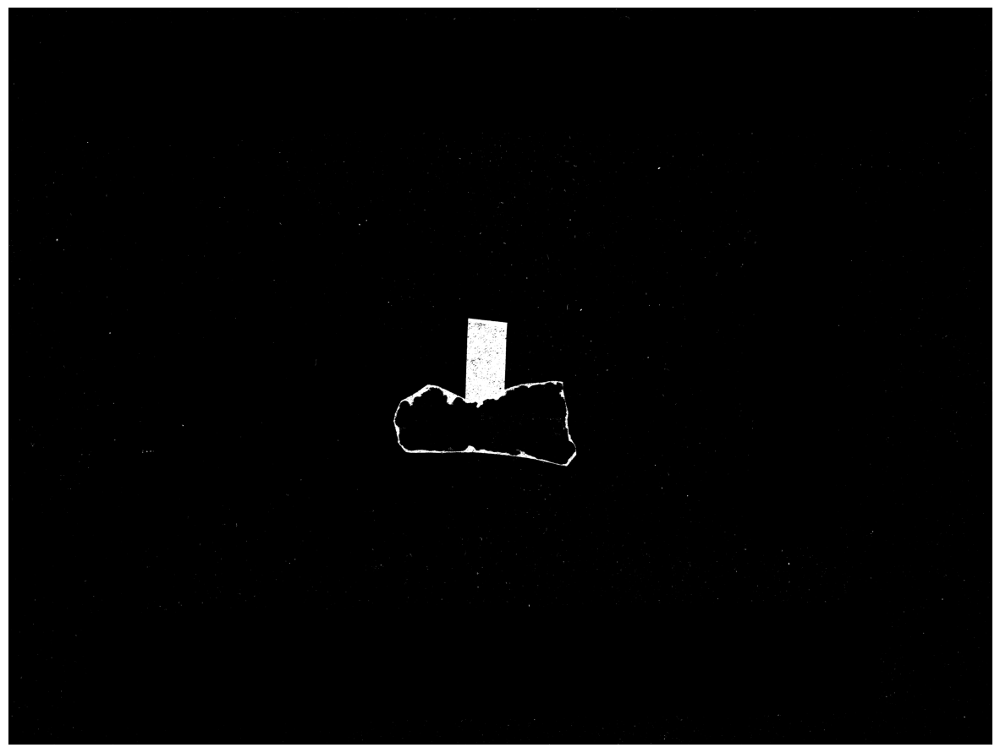

In [29]:
rice = cv2.bitwise_or(rice1,rice2)
plt.figure(figsize=(15, 15))
plt.imshow(rice, cmap='gray')  
plt.axis('off')  
plt.show()

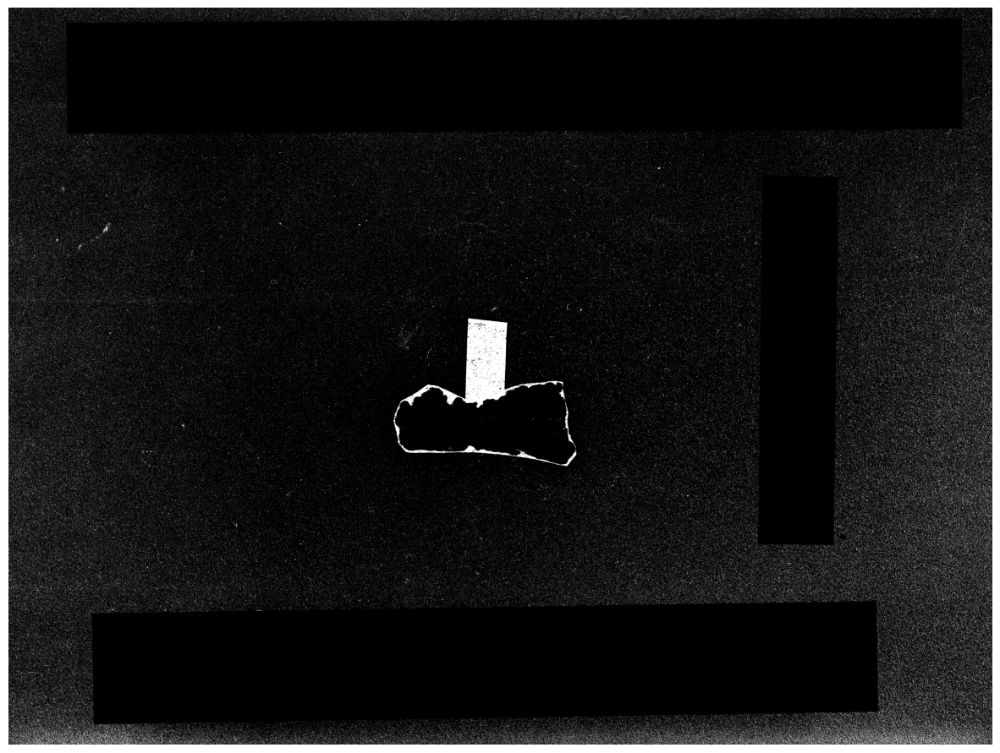

In [30]:
rice = cv2.bitwise_or(rice,rice3)
plt.figure(figsize=(15, 15))
plt.imshow(rice, cmap='gray')  
plt.axis('off')  
plt.show()

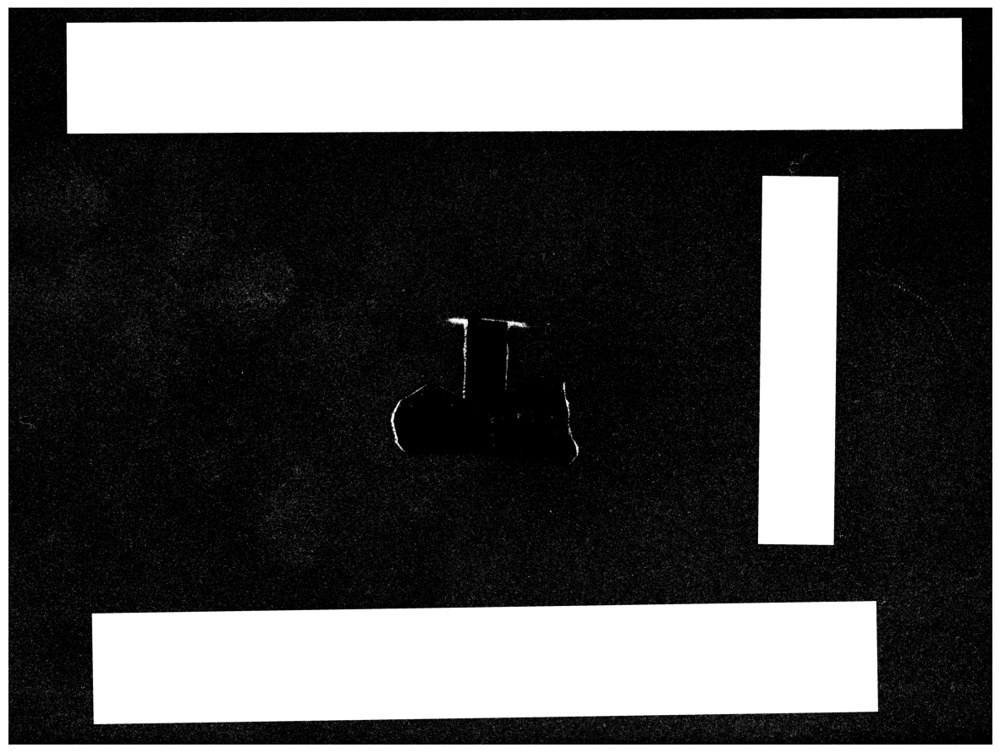

In [31]:
hole = cv2.bitwise_or(hole1,hole2)
plt.figure(figsize=(15, 15))
plt.imshow(hole, cmap='gray')  
plt.axis('off')  
plt.show()

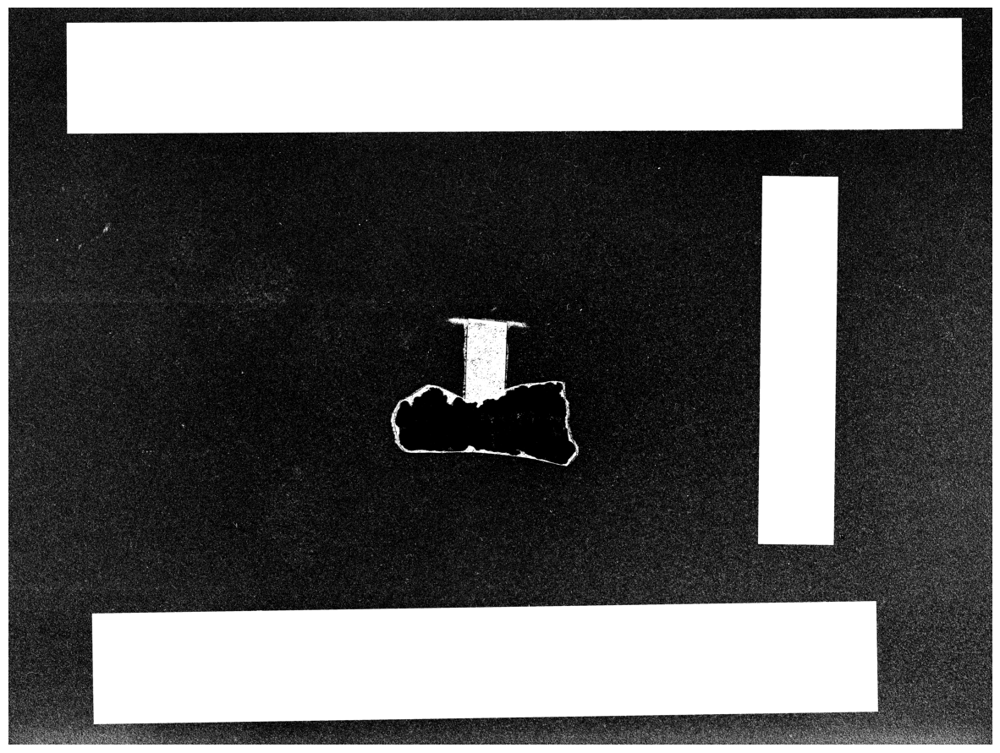

In [32]:
ricehole = cv2.bitwise_or(rice,hole)
plt.figure(figsize=(15, 15))
plt.imshow(ricehole, cmap='gray')  
plt.axis('off')  
plt.show()

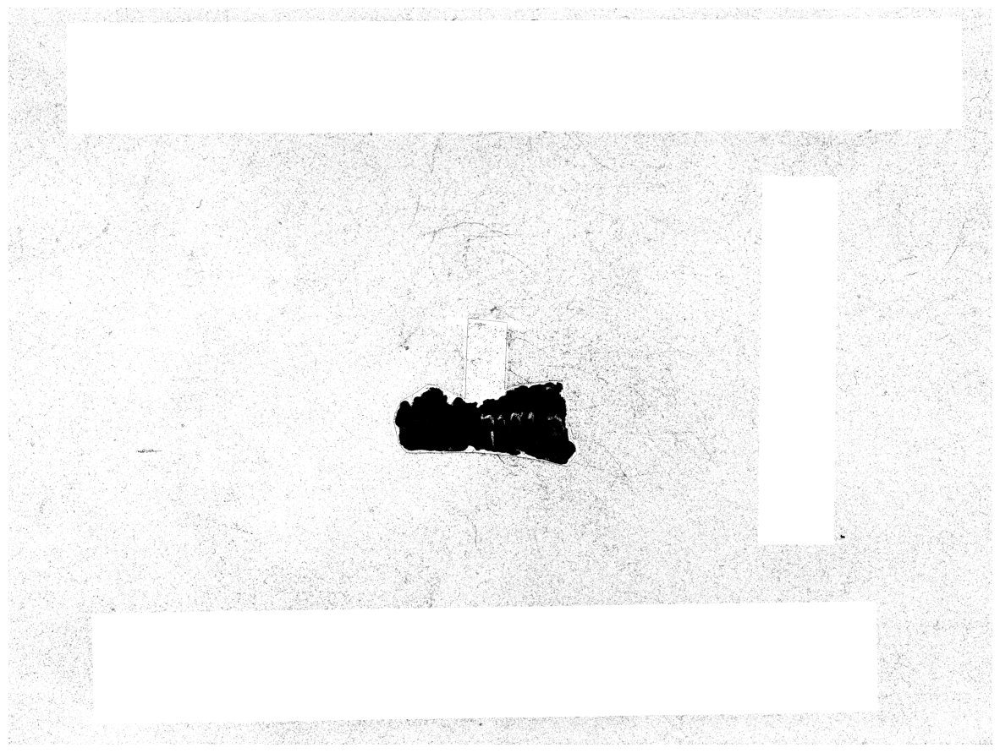

In [33]:
riceholeback = cv2.bitwise_or(ricehole,back1)
plt.figure(figsize=(15, 15))
plt.imshow(riceholeback, cmap='gray')  
plt.axis('off')  
plt.show()

In [67]:
i=par
h=riceholepureback
imagetoseg=ink2

In [68]:
# Assuming x is a binary image where white pixels are the points of interest
white_pixels_mask = imagetoseg > 0  # This creates a boolean mask where white pixels are True


In [69]:
dist_transform_h = cv2.distanceTransform(255-h, cv2.DIST_L2, 5)
dist_transform_i = cv2.distanceTransform(255-i, cv2.DIST_L2, 5)


In [70]:
data_cost_h = np.where(white_pixels_mask, 1 / (1 + dist_transform_h), np.inf)  # Set cost to infinity where not applicable
data_cost_i = np.where(white_pixels_mask, 1 / (1 + dist_transform_i), np.inf)


In [71]:
import maxflow
import numpy as np

# Assume white_pixels_mask is a 2D boolean array from step 1
num_white_pixels = np.sum(white_pixels_mask)

# Initialize graph
g = maxflow.Graph[float](num_white_pixels, num_white_pixels * 4)  # Approximate edges

# Add nodes. One node for each white pixel in x
node_ids = g.add_nodes(num_white_pixels)

# Mapping from white pixel positions to node ids
white_pixel_indices = np.argwhere(white_pixels_mask)
node_id_map = np.full(white_pixels_mask.shape, -1, dtype=int)
node_id_map[white_pixels_mask] = node_ids

# Data costs: Connect nodes to source and sink
for node_id, (y, x) in enumerate(white_pixel_indices):
    g.add_tedge(node_id, data_cost_h[y, x], data_cost_i[y, x])

# Smoothness: Add edges between adjacent white pixels
# Here we use a simple example of connecting each pixel to its right and down neighbors if they are white
for y, x in white_pixel_indices:
    if y + 1 < white_pixels_mask.shape[0] and white_pixels_mask[y + 1, x]:
        g.add_edge(node_id_map[y, x], node_id_map[y + 1, x], 1, 1)  # Adjust the weight as needed
    if x + 1 < white_pixels_mask.shape[1] and white_pixels_mask[y, x + 1]:
        g.add_edge(node_id_map[y, x], node_id_map[y, x + 1], 1, 1)  # Adjust the weight as needed


In [72]:
# Find the minimum cut.
g.maxflow()

# Get the segments for the white pixels
# Assume segmentation as True for pixels connected to the source and False for those connected to the sink
result = np.zeros_like(white_pixels_mask, dtype=bool)
for node_id, (y, x) in enumerate(white_pixel_indices):
    result[y, x] = g.get_segment(node_id)


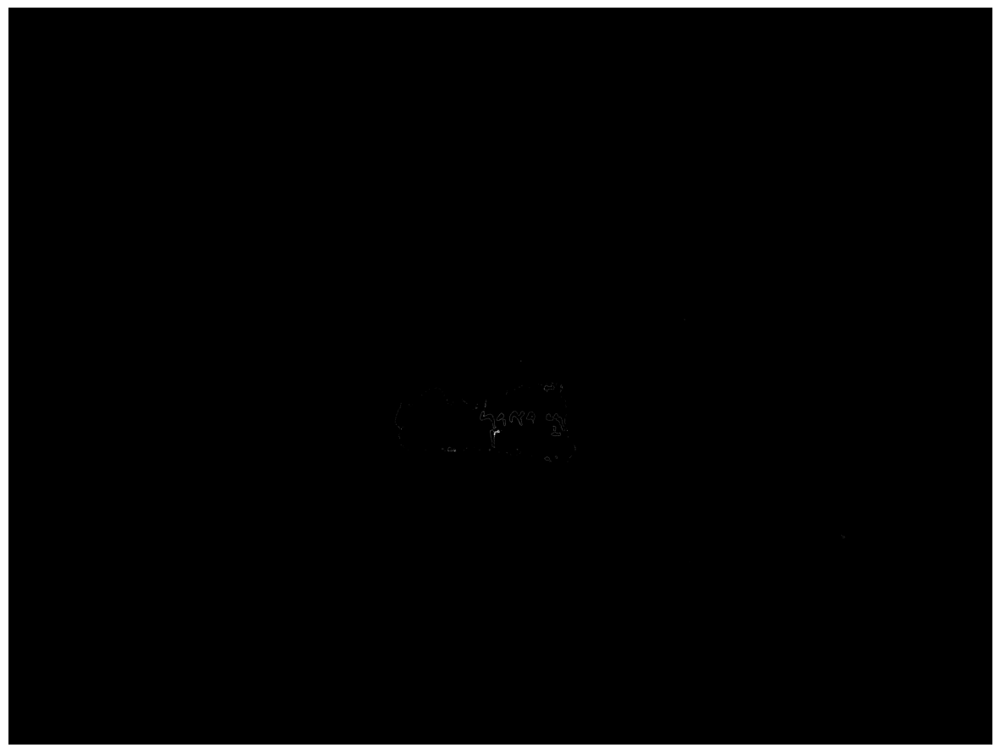

In [73]:
result1=result.astype(np.uint8)*255
plt.figure(figsize=(15, 15))
plt.imshow(result1, cmap='gray')  
plt.axis('off')  
plt.show()

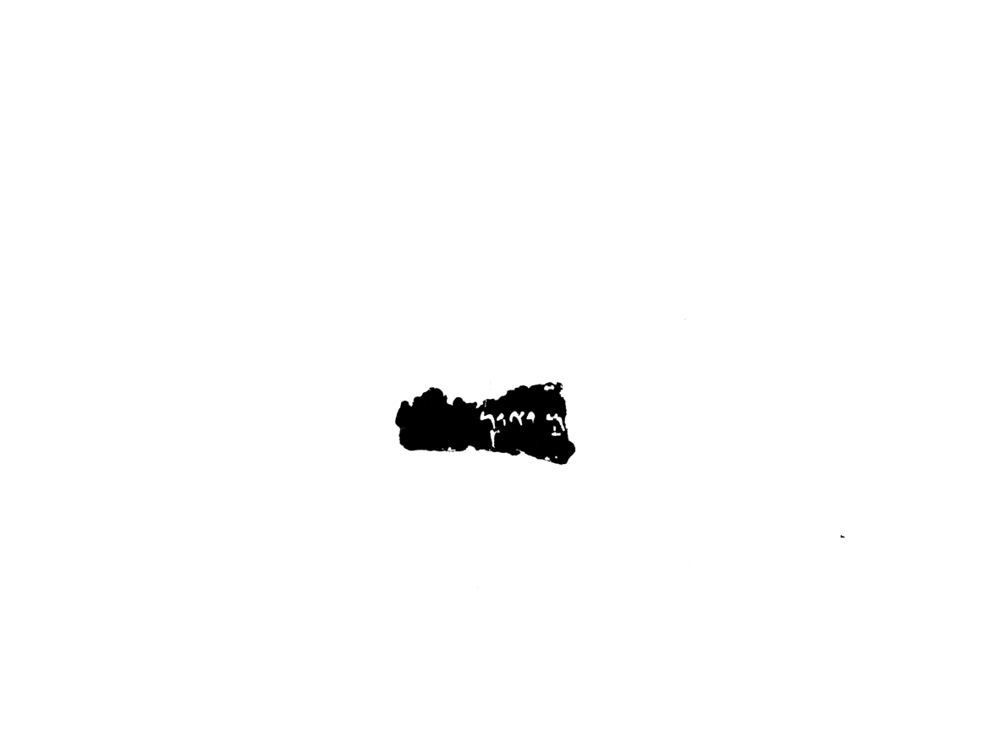

In [74]:
invpar = cv2.bitwise_not(par)
plt.figure(figsize=(15, 15))
plt.imshow(invpar, cmap='gray')  
plt.axis('off')  
plt.show()

In [75]:
i=result1
h=par
imagetoseg=invpar

In [76]:
# Assuming x is a binary image where white pixels are the points of interest
white_pixels_mask = imagetoseg > 0  # This creates a boolean mask where white pixels are True


In [77]:
dist_transform_h = cv2.distanceTransform(255-h, cv2.DIST_L2, 5)
dist_transform_i = cv2.distanceTransform(255-i, cv2.DIST_L2, 5)


In [78]:
data_cost_h = np.where(white_pixels_mask, 1 / (1 + dist_transform_h), np.inf)  # Set cost to infinity where not applicable
data_cost_i = np.where(white_pixels_mask, 1 / (1 + dist_transform_i), np.inf)


In [79]:
import maxflow
import numpy as np

# Assume white_pixels_mask is a 2D boolean array from step 1
num_white_pixels = np.sum(white_pixels_mask)

# Initialize graph
g = maxflow.Graph[float](num_white_pixels, num_white_pixels * 4)  # Approximate edges

# Add nodes. One node for each white pixel in x
node_ids = g.add_nodes(num_white_pixels)

# Mapping from white pixel positions to node ids
white_pixel_indices = np.argwhere(white_pixels_mask)
node_id_map = np.full(white_pixels_mask.shape, -1, dtype=int)
node_id_map[white_pixels_mask] = node_ids

# Data costs: Connect nodes to source and sink
for node_id, (y, x) in enumerate(white_pixel_indices):
    g.add_tedge(node_id, data_cost_h[y, x], data_cost_i[y, x])

# Smoothness: Add edges between adjacent white pixels
# Here we use a simple example of connecting each pixel to its right and down neighbors if they are white
for y, x in white_pixel_indices:
    if y + 1 < white_pixels_mask.shape[0] and white_pixels_mask[y + 1, x]:
        g.add_edge(node_id_map[y, x], node_id_map[y + 1, x], 1, 1)  # Adjust the weight as needed
    if x + 1 < white_pixels_mask.shape[1] and white_pixels_mask[y, x + 1]:
        g.add_edge(node_id_map[y, x], node_id_map[y, x + 1], 1, 1)  # Adjust the weight as needed


In [80]:
# Find the minimum cut.
g.maxflow()

# Get the segments for the white pixels
# Assume segmentation as True for pixels connected to the source and False for those connected to the sink
result = np.zeros_like(white_pixels_mask, dtype=bool)
for node_id, (y, x) in enumerate(white_pixel_indices):
    result[y, x] = g.get_segment(node_id)


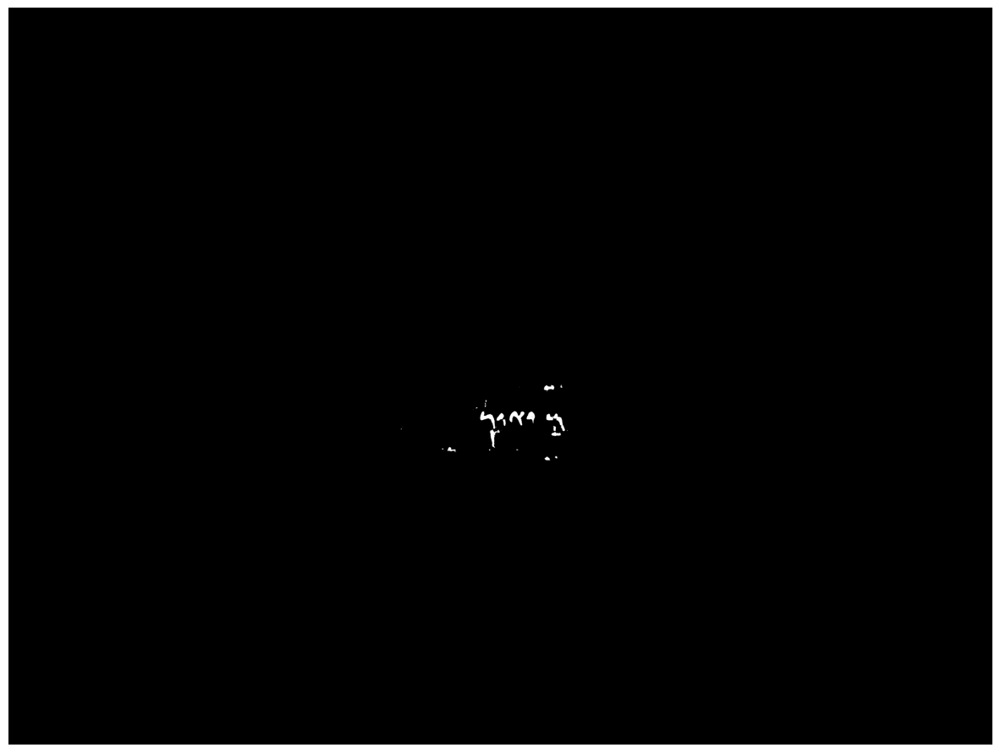

In [81]:
result2=result.astype(np.uint8)*255
plt.figure(figsize=(15, 15))
plt.imshow(result2, cmap='gray')  
plt.axis('off')  
plt.show()

In [49]:
#cv2.imwrite(frag_name+'_ink_ms.png',result2)

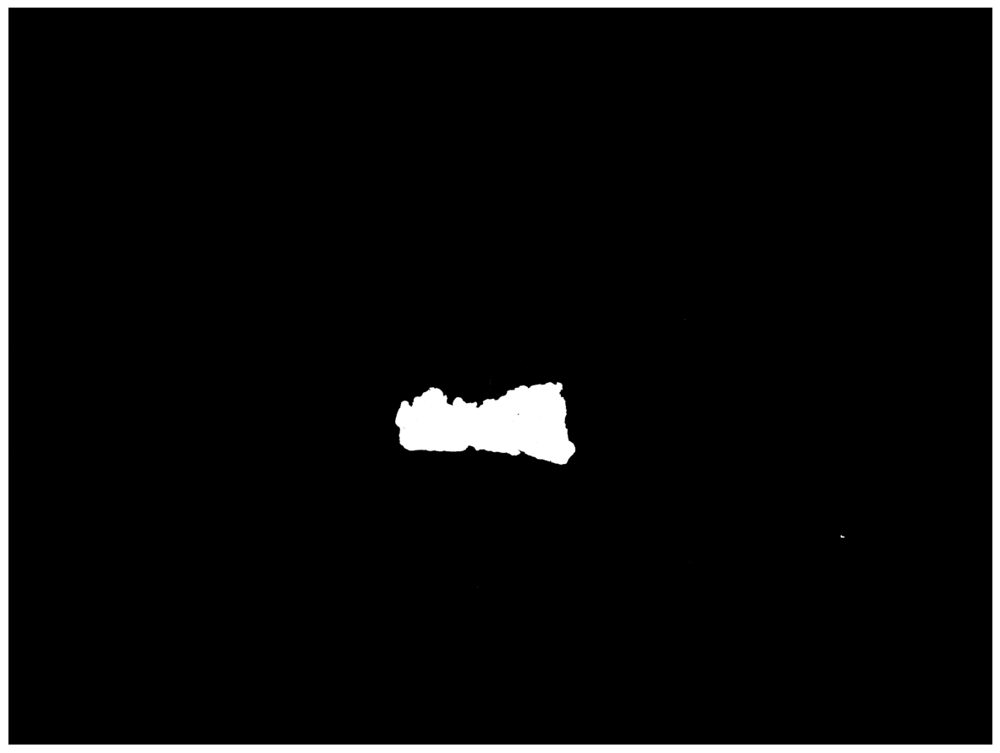

In [82]:
inkpar = cv2.bitwise_or(par,result2)
plt.figure(figsize=(15, 15))
plt.imshow(inkpar, cmap='gray')  
plt.axis('off')  
plt.show()

In [83]:
#cv2.imwrite(frag_name+'_parchement_ms.png',inkpar)

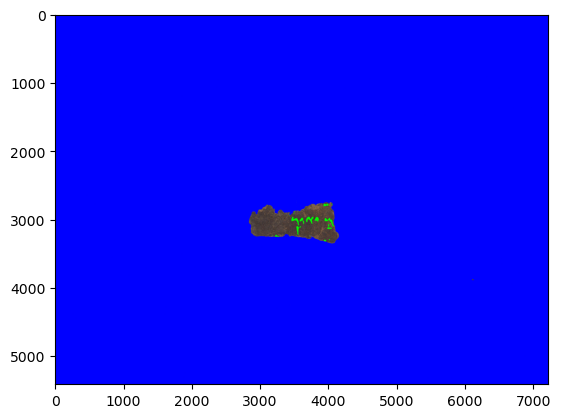

In [84]:
greenink_blueback=color.copy()
blue_mask = inkpar == 0
greenink_blueback[blue_mask] = [255, 0, 0] 


green_mask = result2 == 255
greenink_blueback[green_mask] = [0, 255, 0]  
plt.imshow(greenink_blueback[:,:,::-1])

In [85]:
cv2.imwrite('ms_segments/'+frag_name+'_greenink_blueback.png',greenink_blueback)

True

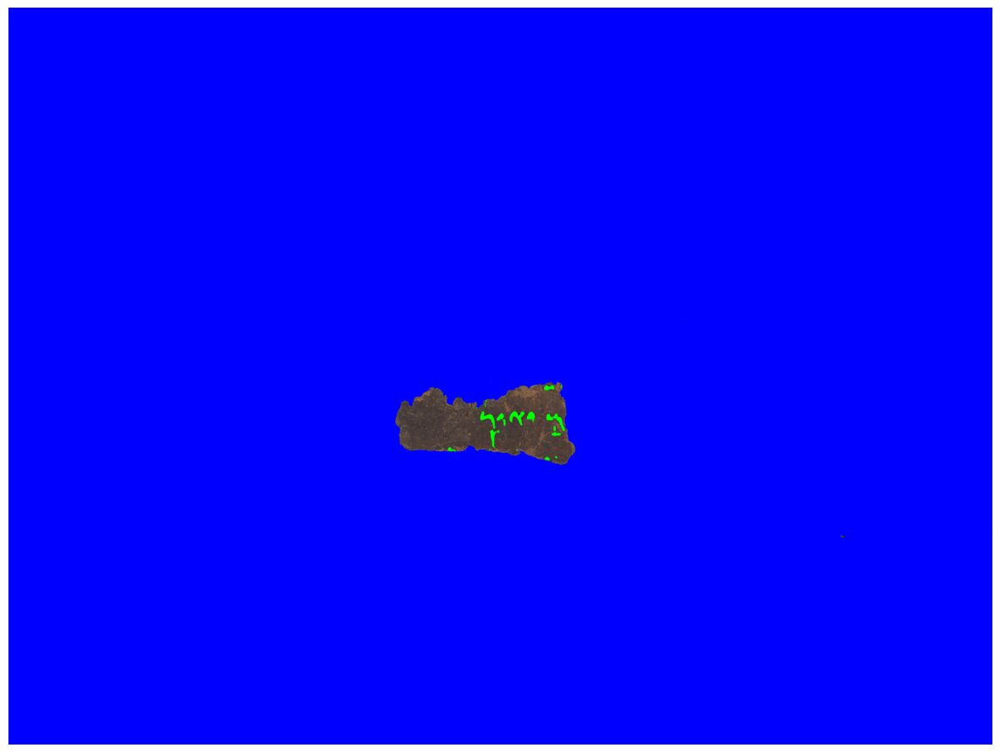

In [86]:
plt.figure(figsize=(15, 15))
plt.imshow(greenink_blueback[:,:,::-1])  
plt.axis('off')  
plt.show()